In [2]:
import astropy
from scipy.optimize import curve_fit
from astropy.table import Table, join
from astropy.io import ascii
import os
import wget
import urllib
import astropy.units as u
from astropy.coordinates import SkyCoord 
import numpy as np
from astropy.io import fits
from astropy.wcs import WCS
from astropy.nddata import Cutout2D
import matplotlib.pyplot as plt
from astropy.utils.data import get_pkg_data_filename
from photutils.aperture import aperture_photometry,ApertureStats
from photutils.aperture import CircularAperture, CircularAnnulus
from astropy.visualization import simple_norm


In [3]:
saga_hosts = Table.read('/cluster/home/sychang/research/saga_stage2_hosts.csv')
saga_sats = Table.read('/cluster/home/sychang/research/saga_stage2_sats.csv')
saga_joined = Table.read('/cluster/home/sychang/research/saga_joined.csv')
tractor_n=Table.read('/cluster/home/sychang/research/survey-bricks-dr9-north.fits.gz')
tractor_s=Table.read('/cluster/home/sychang/research/survey-bricks-dr9-south.fits.gz')
ra_saga=saga_hosts['RA']
dec_saga=saga_hosts['DEC']
ra_n=tractor_n['ra']
dec_n=tractor_n['dec']
brick_n=tractor_n['brickname']
ra_s=tractor_s['ra']
dec_s=tractor_s['dec']
brick_s=tractor_s['brickname']
brick_1=[]
brick_id=[]
ns=[]
brick_tractor=[]

In [4]:
#skycoord拿對應的brickname(標註ns)
ra_desi=[]
dec_desi=[]
c = SkyCoord(ra=ra_saga*u.degree, dec=dec_saga*u.degree)
catalog_n = SkyCoord(ra=ra_n*u.degree, dec=dec_n*u.degree)
catalog_s = SkyCoord(ra=ra_s*u.degree, dec=dec_s*u.degree)
max_sep = 600.0 * u.arcsec
idx_n, d2d_n, d3d_n = c.match_to_catalog_3d(catalog_n)
idx_s, d2d_s, d3d_s = c.match_to_catalog_3d(catalog_s)
sep_constraint_n = d2d_n < max_sep
sep_constraint_s = d2d_s < max_sep
c_matches = c[sep_constraint_n]
catalog_matches = catalog_n[idx_n[sep_constraint_n]]
for i,j in zip(sep_constraint_n,sep_constraint_s):
    if j==True:
        ns.append('s')
    else:
        ns.append('n')
for i,data in enumerate(ns):
    if data=='n':
        brick_tractor.append(idx_n[i])
    elif data=='s':
        brick_tractor.append(idx_s[i])
for ii,jj in zip(brick_tractor,ns):
    if jj=='n':
        brick_id.append(brick_n[ii])
        ra_desi.append(ra_n[ii])
        dec_desi.append(dec_n[ii])
    elif jj=='s':
        brick_id.append(brick_s[ii])
        ra_desi.append(ra_s[ii])
        dec_desi.append(dec_s[ii])

In [5]:
#ns=ns[0:2]
#brick_id=brick_id[0:2]
#brick_1=brick_1[0:2]
for i in brick_id:
    brick_1.append(str(i[0:3]))

In [167]:
idx_n

array([  600,  1094,  1353,  1396,  1353, 14726, 22243, 25443, 25437,
       37832, 40788, 42797, 44532, 44909, 53934, 54604, 55739, 57953,
       58299, 58647, 60250, 60807, 62116, 63480, 66715, 72860, 74491,
       91493, 91519, 91790, 92143, 92143, 92377, 92427, 92719, 93149])

In [168]:
c

<SkyCoord (ICRS): (ra, dec) in deg
    [( 20.449,  17.592), ( 39.548,  -1.319), ( 50.527, -15.4  ),
     ( 55.734, -12.916), ( 95.412, -59.74 ), (123.241,  36.255),
     (139.416,  52.993), (145.225,   5.166), (145.514,   0.336),
     (172.046,  25.661), (178.989,   6.75 ), (182.792,  20.176),
     (185.975,  -3.443), (187.211,  -1.939), (206.599,  43.872),
     (208.324,  33.491), (210.708,  49.173), (215.578,  50.501),
     (216.178,  -3.212), (216.868,  46.147), (219.421,   2.291),
     (221.546,  -0.223), (224.594,  -1.091), (227.456,   0.47 ),
     (234.132,  16.608), (248.088,  19.824), (255.21 ,  23.011),
     (306.912, -47.027), (317.967, -49.284), (323.147, -44.068),
     (329.824, -43.867), (330.137, -43.39 ), (335.913,  -3.432),
     (339.372,  10.532), (348.683,   4.534), (354.131,   0.297)]>

In [7]:
#for i,j,z in zip(brick_1,brick_id,ns):
    os.chdir('/cluster/home/sychang/research/DESI/')
    if os.path.isdir(i):
        os.chdir(i)
    else:
        os.mkdir(i)
        os.chdir(i)
    if z=='s':
        url='https://portal.nersc.gov/cfs/cosmo/data/legacysurvey/dr9/south/coadd/%s'%(i)
        wget.download(url+'/%s/legacysurvey-%s-image-g.fits.fz'%(j,j))
        wget.download(url+'/%s/legacysurvey-%s-image-r.fits.fz'%(j,j))
        wget.download(url+'/%s/legacysurvey-%s-image-z.fits.fz'%(j,j))
        wget.download(url+'/%s/legacysurvey-%s-model-g.fits.fz'%(j,j))
        wget.download(url+'/%s/legacysurvey-%s-model-r.fits.fz'%(j,j))
        wget.download(url+'/%s/legacysurvey-%s-model-z.fits.fz'%(j,j))
    elif z=='n':
        url='https://portal.nersc.gov/cfs/cosmo/data/legacysurvey/dr9/north/coadd/%s'%(i)
        wget.download(url+'/%s/legacysurvey-%s-image-g.fits.fz'%(j,j))
        wget.download(url+'/%s/legacysurvey-%s-image-r.fits.fz'%(j,j))
        wget.download(url+'/%s/legacysurvey-%s-image-z.fits.fz'%(j,j))
        wget.download(url+'/%s/legacysurvey-%s-model-g.fits.fz'%(j,j))
        wget.download(url+'/%s/legacysurvey-%s-model-r.fits.fz'%(j,j))
        wget.download(url+'/%s/legacysurvey-%s-model-z.fits.fz'%(j,j))

IndentationError: unexpected indent (1435691428.py, line 2)

In [142]:
#for i,j,z in zip(brick_1,brick_id,ns):
    os.chdir('/cluster/home/sychang/research/DESI/%s'%(i))
    if z=='s':
        url='https://portal.nersc.gov/cfs/cosmo/data/legacysurvey/dr9/south/tractor/%s/tractor-%s.fits'%(i,j)
        wget.download(url)
    elif z=='n':
        url='https://portal.nersc.gov/cfs/cosmo/data/legacysurvey/dr9/north/tractor/%s/tractor-%s.fits'%(i,j)
        wget.download(url)

In [188]:
c

<SkyCoord (ICRS): (ra, dec) in deg
    [( 20.449,  17.592), ( 39.548,  -1.319), ( 50.527, -15.4  ),
     ( 55.734, -12.916), ( 95.412, -59.74 ), (123.241,  36.255),
     (139.416,  52.993), (145.225,   5.166), (145.514,   0.336),
     (172.046,  25.661), (178.989,   6.75 ), (182.792,  20.176),
     (185.975,  -3.443), (187.211,  -1.939), (206.599,  43.872),
     (208.324,  33.491), (210.708,  49.173), (215.578,  50.501),
     (216.178,  -3.212), (216.868,  46.147), (219.421,   2.291),
     (221.546,  -0.223), (224.594,  -1.091), (227.456,   0.47 ),
     (234.132,  16.608), (248.088,  19.824), (255.21 ,  23.011),
     (306.912, -47.027), (317.967, -49.284), (323.147, -44.068),
     (329.824, -43.867), (330.137, -43.39 ), (335.913,  -3.432),
     (339.372,  10.532), (348.683,   4.534), (354.131,   0.297)]>

residual and cutout

In [12]:
path='/cluster/home/sychang/research/DESI/' #這就是欲進行檔名更改的檔案路徑，路徑的斜線是為/，要留意下！
tractor_id1=[]
tractor_id2=[]
tractor_psfr=[]
tractor_psf=[]
tractor_ra=[]
tractor_dec=[]
tractor_psf_r=[]
tractor_shape=[]
n=0
for i,j in zip(brick_1,brick_id): #資料夾裡面的檔案
    os.chdir(path)
    os.chdir(i)
    tractor_ra1=[]
    tractor_dec1=[]
    tractor_psf_r1=[]
    tractor_path=path+'%s/tractor-%s.fits'%(i,j)
    tractor_open=fits.open(tractor_path)
    tractor_psf=tractor_open[1].data.field('type')
    tractor_ra=tractor_open[1].data.field('ra')
    tractor_dec=tractor_open[1].data.field('dec')
    tractor_psf_r=tractor_open[1].data.field('psfsize_r')
    tractor_shape1=tractor_open[1].data.field('shape_r')
    c_desi = SkyCoord(ra=tractor_ra*u.degree, dec=tractor_dec*u.degree)
    idx, d2d, d3d = c[n].match_to_catalog_3d(c_desi)
        
    for i,ii,j,k,m in zip(tractor_psf,tractor_psf_r,tractor_ra,tractor_dec,tractor_shape1):
        if i=='PSF':
            tractor_ra1.append(j)
            tractor_dec1.append(k)
            tractor_psf_r1.append(ii)
    tractor_id1.append(tractor_ra1)
    tractor_id2.append(tractor_dec1)
    tractor_psfr.append(tractor_psf_r1)
    tractor_shape.append(tractor_shape1[idx])
    n+=1

In [30]:
len(tractor_id1[5])

1784

In [55]:
path='/cluster/home/sychang/research/DESI/' #這就是欲進行檔名更改的檔案路徑，路徑的斜線是為/，要留意下！
ra_pix=[]
dec_pix=[]
position_m=[]
n=0
for i,j,k,l in zip(brick_1,brick_id,tractor_id1,tractor_id2): #資料夾裡面的檔案
    os.chdir(path)
    os.chdir(i)
    image_path=path+'%s/legacysurvey-%s-image-r.fits.fz'%(i,j)
    model_path=path+'%s/legacysurvey-%s-model-r.fits.fz'%(i,j)
    r_raw = fits.open(image_path)
    r_model = fits.open(model_path)
    r1=r_raw[1].data
    r2=r_model[1].data
    residual=r1-r2
    fn = get_pkg_data_filename(image_path)
    f = fits.open(fn)
    w = WCS(f[1].header)
    dec_max=f[1].header['DECMAX']
    dec_min=f[1].header['DECMIN']
    x, y = w.world_to_pixel(c[n])
    print(x, y)
    size_pix=residual.shape[1]/((abs(dec_max)-abs(dec_min))*60)#1arcmin=240pixel
    size = (1000,1000)     # pixels
    cutout = Cutout2D(residual, (x,y), size)
    c1 = SkyCoord(ra=k*u.degree, dec=l*u.degree)
    mask1=[]
    for kk in range(0,len(c1)):
        x1,y1=w.world_to_pixel(c1[kk])
        p_mask = cutout.to_cutout_position((x1, y1))
        '''if p_mask[0]<cutout.shape[0] and p_mask[1]<cutout.shape[1] and p_mask[0]>0 and p_mask[1]>0:'''
        mask1.append(p_mask)
    position_m.append(mask1)
    '''plt.figure()
    plt.imshow(cutout.data, origin='lower',vmin=0,vmax=0.01)'''
    n+=1

2962.3616076237795 3063.9015332315207
2857.150804144406 851.3700008701925
3204.87208901904 3173.1651324997174
2271.2702699593046 2953.6236690390674
1887.1223702297295 1936.817332136438
1870.6016086354884 1868.1220796979774
355.2650591431202 1704.9985102948733
2532.251459062712 645.2596790198827
3324.5810890315497 2981.117304472042
2563.528385267852 576.7314564910548
158.1060891179868 1799.6664524860469
1795.9393800804494 782.6745525753314
539.9122113378048 2582.6191040710128
618.4056156449242 2637.613337388057
3039.0341042498394 3476.779482799279
1018.1177810800109 1676.097910444379
1720.0271498477928 741.4976629627786
357.81679789677423 1814.8577895351323
1761.5906087552394 2321.654229489923
2104.123868316 384.310426745777
1167.8597421307295 2362.8904128685263
2884.9010550302296 2170.513861348425
2225.288675439302 549.1436691469576
686.4726825080045 1387.3251511956544
747.3508884512744 3283.7221257983365
623.8583647495179 2816.6684071980308
2000.5752947130513 1950.7205167668644
1464.7

In [47]:
len(position_m[5])

1784

In [54]:
cutout.data.shape[0]

1000

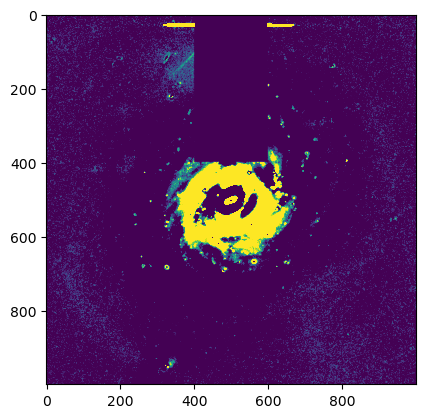

In [57]:
for i in range(0,400):
    for j in range(400,600):
        cutout.data[i,j]=False
plt.imshow(cutout.data,origin='upper',vmin=0,vmax=0.01)

In [52]:
cutout.shape[0]

1000

to_mask

In [59]:
position_mask=CircularAperture(position_m[35], r=10)
masks = position_mask.to_mask(method='center')

In [ ]:
data_weighted = masks[150].multiply(cutout.data)
plt.imshow(data_weighted,origin='lower',vmin=0,vmax=0.01)

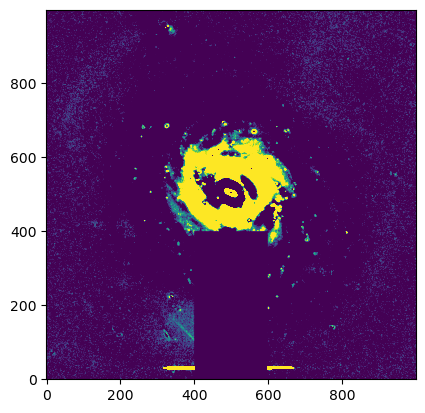

In [61]:
plt.imshow(cutout.data,origin='lower',vmin=0,vmax=0.01)

In [62]:
cutout.shape[0]

1000

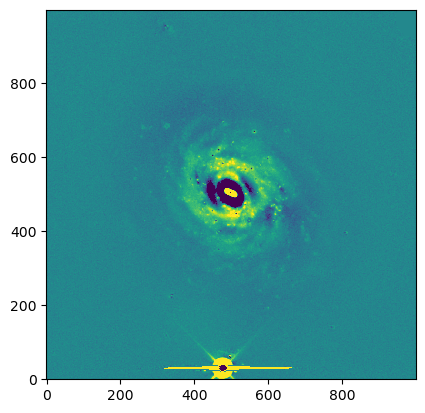

In [30]:
norm = simple_norm(cutout.data, 'sqrt', percent=99)
plt.figure()
plt.imshow(cutout.data, norm=norm, interpolation='nearest',origin='lower')

2962.3616076237795 3063.9015332315207
2857.150804144406 851.3700008701925
3204.87208901904 3173.1651324997174
2271.2702699593046 2953.6236690390674
1887.1223702297295 1936.817332136438
1870.6016086354884 1868.1220796979774
355.2650591431202 1704.9985102948733
2532.251459062712 645.2596790198827
3324.5810890315497 2981.117304472042
2563.528385267852 576.7314564910548
158.1060891179868 1799.6664524860469


/tmp/ipykernel_17497/711534862.py:61: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


1795.9393800804494 782.6745525753314
539.9122113378048 2582.6191040710128
618.4056156449242 2637.613337388057
3039.0341042498394 3476.779482799279
1018.1177810800109 1676.097910444379
1720.0271498477928 741.4976629627786
357.81679789677423 1814.8577895351323
1761.5906087552394 2321.654229489923
2104.123868316 384.310426745777
1167.8597421307295 2362.8904128685263
2884.9010550302296 2170.513861348425
2225.288675439302 549.1436691469576
686.4726825080045 1387.3251511956544
747.3508884512744 3283.7221257983365
623.8583647495179 2816.6684071980308
2000.5752947130513 1950.7205167668644
1464.776792764575 1428.5128174179072
841.941631771459 1331.7243761346954
1677.19500333555 865.2125672804941
1834.996106767286 191.93161374751367
1000.9996386400321 -124.4828133323474
32 error
Intel MKL ERROR: Parameter 6 was incorrect on entry to DGELSD.

817.9996303885787 2733.8775990672175
946.794277590461 2239.33982135274
570.9464961865019 2266.8006052122773
1716.9705548218442 2445.3440114259106


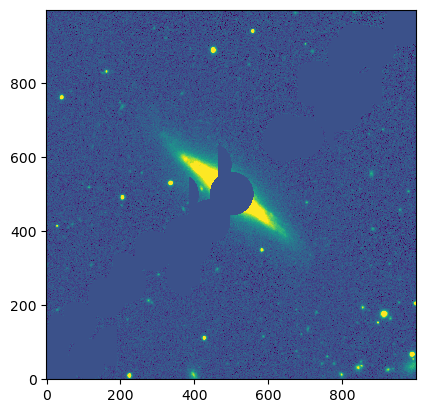

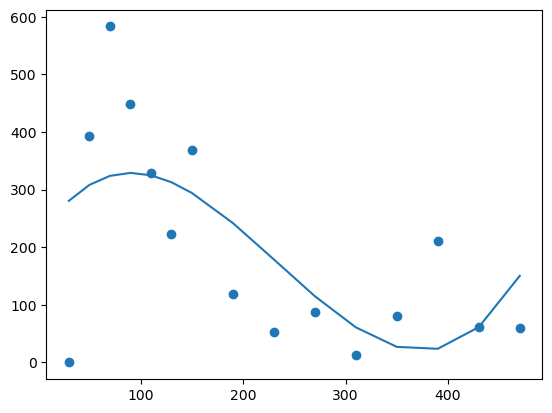

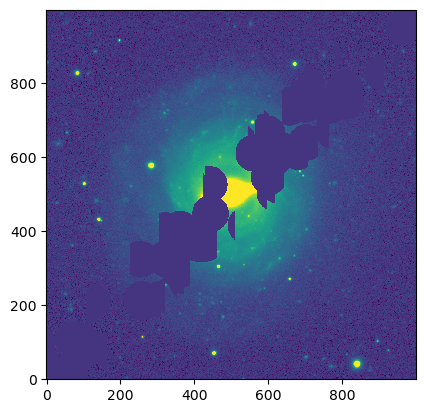

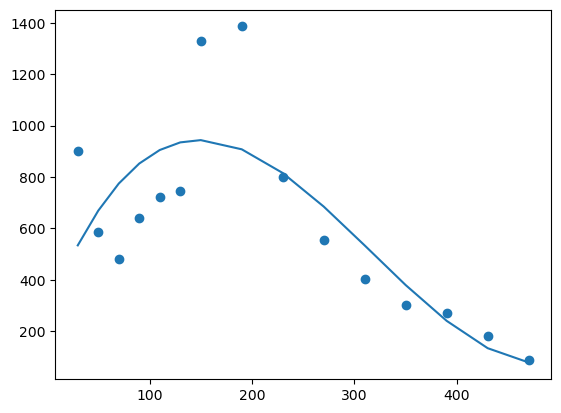

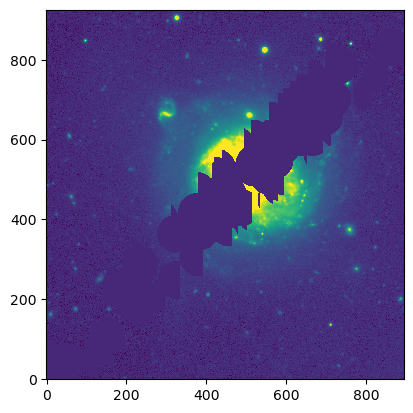

...

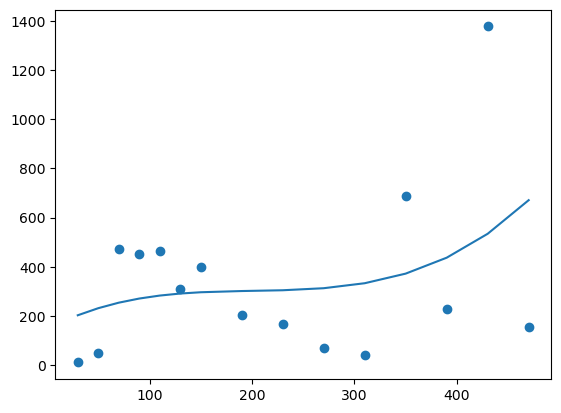

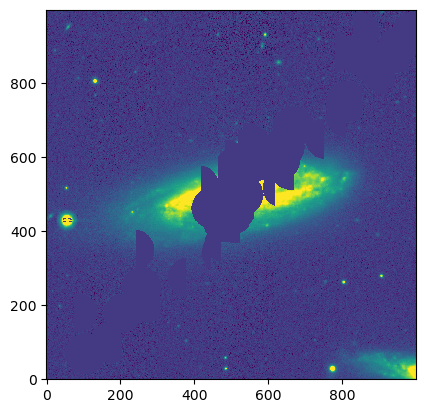

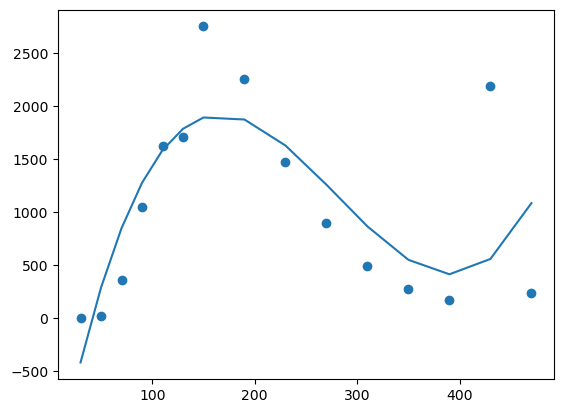

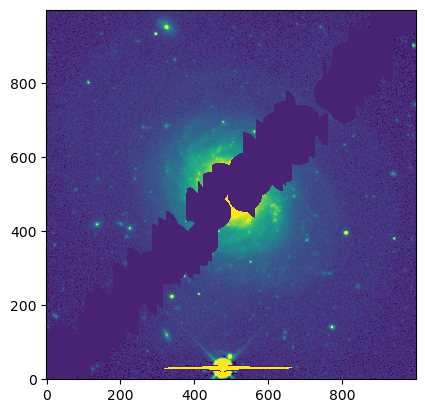

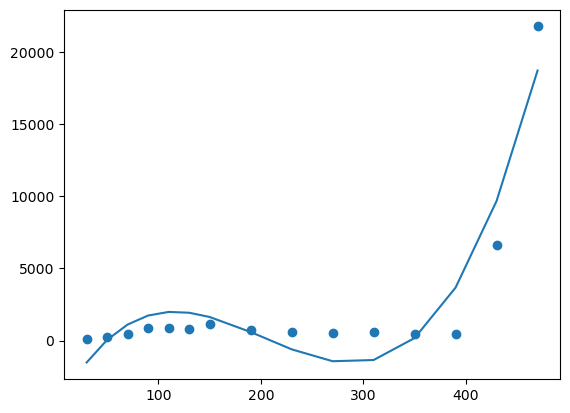

In [66]:
#原圖
path='/cluster/home/sychang/research/DESI/' #這就是欲進行檔名更改的檔案路徑，路徑的斜線是為/，要留意下！
ra_pix=[]
dec_pix=[]
n=0
def sersic(x, R, n):
    return R*np.exp((-1.9992*n+0.3271)*((x/R)**(1/n)-1))
for i,j,k in zip(brick_1,brick_id,position_mask): #資料夾裡面的檔案
    os.chdir(path)
    os.chdir(i)
    image_path=path+'%s/legacysurvey-%s-image-r.fits.fz'%(i,j)
    model_path=path+'%s/legacysurvey-%s-model-r.fits.fz'%(i,j)
    r_raw = fits.open(image_path)
    r_model = fits.open(model_path)
    r1=r_raw[1].data
    r2=r_model[1].data
    residual=r1-r2
    fn = get_pkg_data_filename(image_path)
    f = fits.open(fn)
    w = WCS(f[1].header)
    dec_max=f[1].header['DECMAX']
    dec_min=f[1].header['DECMIN']
    x, y = w.world_to_pixel(c[n])
    print(x, y)
    size_pix=r1.shape[1]/((abs(dec_max)-abs(dec_min))*60)#1arcmin=240pixel
    size = (1000,1000)     # pixels
    cutout = Cutout2D(r1, (x,y), size)
    m1 = np.zeros(cutout.shape, dtype=bool)
    for pp in range(len(position_m[n])):
        rg_s=int(position_m[n][pp][0])-int(tractor_psfr[n][pp]*10)*4*2
        rg_f=int(position_m[n][pp][0])+int(tractor_psfr[n][pp]*10)*4*2
        if rg_s<=0:
            rg_s=0
        if rg_f>=cutout.shape[0]:
            rg_f=cutout.shape[0]
        for ii in range(rg_s,rg_f):
            for jj in range(rg_s,rg_f):
                try:
                    if ((ii-position_m[n][pp][0])**2+(jj-position_m[n][pp][1])**2)<=(tractor_psfr[n][pp]*10*4)**2:
                        m1[ii,jj]=True
                        cutout.data[ii,jj]=False
                except:
                    continue
            
    n+=1
    #profile
    positions = cutout.to_cutout_position((x, y))
    circul=[]
    circul_o=[]
    for i in range(30,150,20):
        circul.append(i)
    for i in range(150,500,40):
        circul_o.append(i)
    annulus_aperture=[]
    for i in circul:
        annulus_aperture.append(CircularAnnulus(positions, r_in=i, r_out=i+20))
    for i in circul_o:
        annulus_aperture.append(CircularAnnulus(positions, r_in=i, r_out=i+40))
    circul=circul+circul_o
    norm = simple_norm(cutout.data, 'sqrt', percent=99)
    plt.figure()
    plt.imshow(cutout.data, norm=norm, interpolation='nearest',origin='lower')
    '''for u in annulus_aperture:
        ann_patches = u.plot(color='red', lw=2,label='Photometry annulus')
    handles = (ann_patches[0])'''
    phot_table = aperture_photometry(cutout.data, annulus_aperture,mask=m1)
    profile_data=[]
    for col in phot_table.colnames:
        phot_table[col].info.format = '%.8g'  # for consistent table output
    for i in range(0,len(annulus_aperture)):
        profile_data.append(float(phot_table['aperture_sum_%s'%(i)]))
    try:
        linear_model=np.polyfit(circul,profile_data,3)
        linear_model_fn=np.poly1d(linear_model)
        plt.figure()
        plt.scatter(circul,profile_data,linestyle='-')
        plt.plot(circul,linear_model_fn(circul))
    except:
        print('%s error'%(n))

In [ ]:
#原圖cutout
path='/cluster/home/sychang/research/DESI/' #這就是欲進行檔名更改的檔案路徑，路徑的斜線是為/，要留意下！
ra_pix=[]
dec_pix=[]
n=0
def sersic(x, R, n):
    return R*np.exp((-1.9992*n+0.3271)*((x/R)**(1/n)-1))
for i,j,k in zip(brick_1,brick_id,position_mask): #資料夾裡面的檔案
    os.chdir(path)
    os.chdir(i)
    image_path=path+'%s/legacysurvey-%s-image-r.fits.fz'%(i,j)
    model_path=path+'%s/legacysurvey-%s-model-r.fits.fz'%(i,j)
    r_raw = fits.open(image_path)
    r_model = fits.open(model_path)
    r1=r_raw[1].data
    r2=r_model[1].data
    residual=r1-r2
    fn = get_pkg_data_filename(image_path)
    f = fits.open(fn)
    w = WCS(f[1].header)
    dec_max=f[1].header['DECMAX']
    dec_min=f[1].header['DECMIN']
    x, y = w.world_to_pixel(c[n])
    print(x, y)
    size_pix=residual.shape[1]/((abs(dec_max)-abs(dec_min))*60)#1arcmin=240pixel
    size = (1000,1000)     # pixels
    cutout = Cutout2D(residual, (x,y), size)
    cutout2 = Cutout2D(r1, (x,y), size)
    cutout3 = Cutout2D(r2, (x,y), size)
    m1 = np.zeros(cutout.shape, dtype=bool)
    for pp in range(len(position_m[n])):
        rg_s=int(position_m[n][pp][0])-int(tractor_psfr[n][pp])*4*2
        rg_f=int(position_m[n][pp][0])+int(tractor_psfr[n][pp])*4*2
        if rg_s<=0:
            rg_s=0
        if rg_f>=cutout.shape[0]:
            rg_f=cutout.shape[0]
        for ii in range(rg_s,rg_f):
            for jj in range(rg_s,rg_f):
                if ((ii-position_m[n][pp][0])**2+(jj-position_m[n][pp][1])**2)<=(tractor_psfr[n][pp]*4)**2:
                    m1[ii,jj]=True
                    cutout.data[ii,jj]=False
            
    #profile
    positions = cutout.to_cutout_position((x, y))
    circul=[]
    circul_o=[]
    for i in range(30,150,20):
        circul.append(i)
    for i in range(150,500,40):
        circul_o.append(i)
    annulus_aperture=[]
    for i in circul:
        annulus_aperture.append(CircularAnnulus(positions, r_in=i, r_out=i+20))
    for i in circul_o:
        annulus_aperture.append(CircularAnnulus(positions, r_in=i, r_out=i+40))
    circul=circul+circul_o
    norm = simple_norm(cutout.data, 'sqrt', percent=99)
    plt.figure()
    plt.imshow(cutout.data, norm=norm, interpolation='nearest',origin='lower')
    for u in annulus_aperture:
        ann_patches = u.plot(color='red', lw=2,label='Photometry annulus')
    handles = (ann_patches[0])
    phot_table = aperture_photometry(cutout.data, annulus_aperture,mask=m1)
    phot_table2 = aperture_photometry(cutout2.data, annulus_aperture,mask=m1)
    phot_table3 = aperture_photometry(cutout3.data, annulus_aperture,mask=m1)
    profile_data=[]
    profile_data2=[]
    profile_data3=[]
    for col in phot_table.colnames:
        phot_table[col].info.format = '%.8g'  # for consistent table output
    for i in range(0,len(annulus_aperture)):
        profile_data.append(float(phot_table['aperture_sum_%s'%(i)]))
    for col in phot_table2.colnames:
        phot_table2[col].info.format = '%.8g'  # for consistent table output
    for i in range(0,len(annulus_aperture)):
        profile_data2.append(float(phot_table2['aperture_sum_%s'%(i)]))
    for col in phot_table3.colnames:
        phot_table3[col].info.format = '%.8g'  # for consistent table output
    for i in range(0,len(annulus_aperture)):
        profile_data3.append(float(phot_table3['aperture_sum_%s'%(i)]))
    try:
        #popt, _ = curve_fit(objective, x, y)
        #a, b, c, d, e, f = popt
        # plot input vs output
        #pyplot.scatter(x, y)
        # define a sequence of inputs between the smallest and largest known inputs
        #x_line = arange(min(x), max(x), 1)
        # calculate the output for the range
        #y_line = objective(x_line, a, b, c, d, e, f)
        # create a line plot for the mapping function
        #pyplot.plot(x_line, y_line, '--', color='red')
        '''linear_model=np.polyfit(circul,profile_data,3)
        linear_model_fn=np.poly1d(linear_model)
        linear_model2=np.polyfit(circul,profile_data2,3)
        linear_model_fn2=np.poly1d(linear_model2)'''
        plt.figure()
        plt.scatter(circul,profile_data,label='residual profile')
        plt.scatter(circul,profile_data2,label='raw profile')
        plt.scatter(circul,profile_data3,label='model profile')
        plt.plot(circul,profile_data)
        plt.plot(circul,profile_data2)
        plt.plot(circul,profile_data3)
        plt.axvline(x=tractor_shape[n]*4,linestyle='--')
        plt.legend(loc='upper right',fontsize=12)
        n+=1
    except:
        print('%s error'%(n))
        n+=1

In [76]:
positions = cutout.to_cutout_position((x, y))
#aperture = CircularAperture(positions, r=30)
circul=[]
circul_o=[]
for i in range(30,150,20):
    circul.append(i)
for i in range(150,270,40):
    circul_o.append(i)
annulus_aperture=[]
for i in circul:
    annulus_aperture.append(CircularAnnulus(positions, r_in=i, r_out=i+20))
for i in circul_o:
    annulus_aperture.append(CircularAnnulus(positions, r_in=i, r_out=i+40))
circul=circul+circul_o

"plt.legend(loc=(0.17, 0.05), facecolor='#458989', labelcolor='white',\n           handles=handles, prop={'weight': 'bold', 'size': 11})"

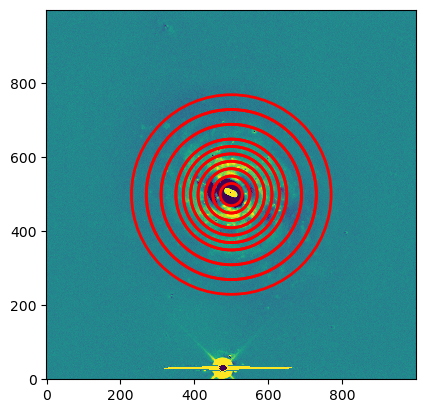

In [77]:
norm = simple_norm(cutout.data, 'sqrt', percent=99)
plt.imshow(cutout.data, norm=norm, interpolation='nearest',origin='lower')
for u in annulus_aperture:
    ann_patches = u.plot(color='red', lw=2,label='Photometry annulus')
handles = (ann_patches[0])
'''plt.legend(loc=(0.17, 0.05), facecolor='#458989', labelcolor='white',
           handles=handles, prop={'weight': 'bold', 'size': 11})'''

In [78]:
len(annulus_aperture)

9

In [79]:
aperstats = []
bkg_mean = []
for i in annulus_aperture:
    temp_aperstats=ApertureStats(cutout.data, i)
    aperstats.append(temp_aperstats)
    bkg_mean.append(temp_aperstats.mean)

In [80]:
bkg_mean

[-0.010319725125880086,
 0.025590360182445395,
 0.03556683839640761,
 0.019009235350050342,
 0.012704435937247894,
 0.008956734004504883,
 -6.937918414758229e-05,
 -0.0036189262949479746,
 -0.0038933672902144367]

In [81]:
phot_table = aperture_photometry(cutout.data, annulus_aperture)
profile_data=[]
for col in phot_table.colnames:
    phot_table[col].info.format = '%.8g'  # for consistent table output
print(phot_table)
for i in range(0,len(annulus_aperture)):
    profile_data.append(phot_table['aperture_sum_%s'%(i)])

 id  xcenter   ycenter  ... aperture_sum_6 aperture_sum_7 aperture_sum_8
       pix       pix    ...                                             
--- --------- --------- ... -------------- -------------- --------------
  1 499.97055 499.34401 ...     -2.8281613     -191.07367     -244.57889


In [82]:
aperture_area=[]
for i in annulus_aperture:
    aperture_area.append(i.area)

In [83]:
 aperture_area

[5026.548245743669,
 7539.822368615503,
 10053.096491487338,
 12566.370614359172,
 15079.644737231007,
 17592.91886010284,
 42725.66008882118,
 52778.75658030852,
 62831.853071795864]

In [84]:
total_bkg=[]
for i,j in zip(bkg_mean , aperture_area):
    total_bkg.append(i * j)
print(total_bkg)

[-51.87259622804941, 192.9467701245293, 357.5568582962225, 238.8770965043102, 191.57838052060868, 157.5750945927784, -2.964271439129332, -191.00243000313696, -244.62748153328948]


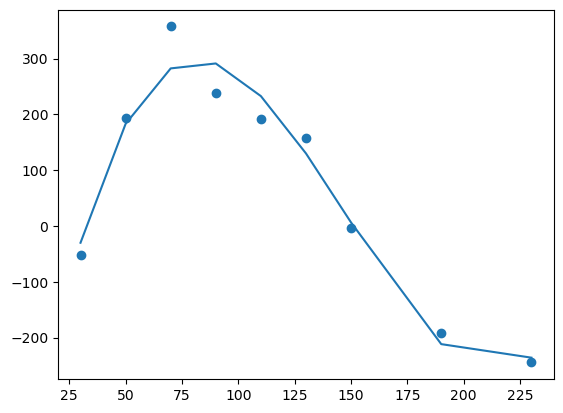

In [85]:
linear_model=np.polyfit(circul,total_bkg,3)
linear_model_fn=np.poly1d(linear_model)
plt.figure()
plt.scatter(circul,total_bkg,linestyle='-')
plt.plot(circul,linear_model_fn(circul))